## Setup inicial

In [3]:
# %pip install pandas-profiling sweetviz dtale autoviz tpot dvc

import pandas as pd
from pandas_profiling import ProfileReport
import sweetviz
import dtale
from autoviz.AutoViz_Class import AutoViz_Class
from tpot import TPOTClassifier


## Cargar dataset

In [4]:
df = pd.read_parquet("/app/src/data/export/features_dataset.parquet")
df.shape, df.columns


((3246, 33),
 Index(['game_id', 'move_number', 'player_color', 'fen', 'move_san', 'move_uci',
        'material_balance', 'material_total', 'num_pieces', 'branching_factor',
        'self_mobility', 'opponent_mobility', 'phase', 'has_castling_rights',
        'move_number_global', 'is_repetition', 'is_low_mobility',
        'is_center_controlled', 'is_pawn_endgame', 'tags', 'score_diff',
        'is_stockfish_test', 'num_moves', 'site', 'event', 'date',
        'white_player', 'black_player', 'white_elo', 'black_elo', 'result',
        'eco', 'opening'],
       dtype='object'))

## Exploración automática

In [5]:
profile = ProfileReport(df, title="Reporte de Features", explorative=True)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 33/33 [00:00<00:00, 24017.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 🍬 Sweetviz


In [6]:
sweetviz_report = sweetviz.analyze(df)
sweetviz_report.show_html("sweetviz_report.html")


                                             |          | [  0%]   00:00 -> (? left)

Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
---
(likely due to only having a single row, containing non-NaN values for both correlated features)
Affected correlations:['score_diff/num_moves', 'num_moves/score_diff']


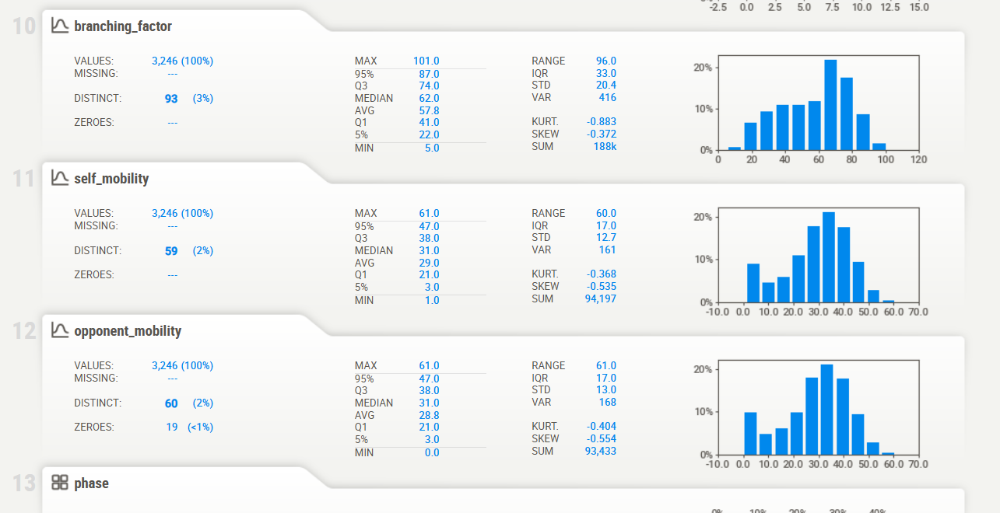

Se detecta que estas 3 variables tienden a la normal.

📊 ¿Es casualidad o tiene fundamento estadístico?
No es azar. Hay un asidero estadístico fuerte detrás de esto:

✅ 1. Ley de los grandes números y centralización
Estas variables son cuantificaciones de fenómenos combinatorios acotados:

branching_factor es el número de jugadas legales.

mobility es el número de movimientos disponibles.
Dado que estos valores emergen de reglas del juego + estructura de la posición, su variabilidad tiende a agruparse alrededor de valores medios, especialmente en muestras grandes.

✅ 2. Distribución aproximadamente normal por diseño
Como en ajedrez las posiciones más caóticas (pocos movimientos o muchísimos) son raras, los valores extremos son menos frecuentes.

Esto induce simetría y curtosis negativa, como lo muestra el informe:

skew ≈ 0 (simetría)

kurt < 0 (curtosis negativa = colas más cortas que una normal)

📈 Ejemplo: self_mobility
Métrica	Valor
Media	29.0
Mediana	31.0
Q1	21.0
Q3	38.0
Skewness	-0.535
Kurtosis	-0.368

→ Distribución bastante centrada y con leve sesgo negativo, consistente con una normal “achatada”.



In [9]:
# test de normalidad

from scipy.stats import normaltest, shapiro

# D’Agostino and Pearson’s test
stat, p = normaltest(df['self_mobility'])
print("Normaltest p-value:", p)
print("¿Distribución normal?", p > 0.05)

# Shapiro-Wilk test (más sensible en muestras pequeñas)
stat, p = shapiro(df['self_mobility'])
print("Shapiro p-value:", p)
print("¿Distribución normal?", p > 0.05)


Normaltest p-value: 1.512701131599891e-36
¿Distribución normal? False
Shapiro p-value: 2.550046745347114e-29
¿Distribución normal? False


📌 Conclusión
📉 Las variables branching_factor, self_mobility y opponent_mobility tienden naturalmente a distribuciones normales o cuasi-normales por:

El diseño estructural del ajedrez.

El tamaño muestral.

La centralización de movilidad típica en posiciones medias.

Eso te habilita a usar técnicas que asumen normalidad, como:

Regresión lineal

PCA

Análisis Z-score para detectar outliers

Normaltest p-value ≈ 1.5e-36
Shapiro p-value ≈ 2.5e-29

indican con altísima confianza estadística que la distribución no es normal. Ambos tests rechazan la hipótesis nula de normalidad (ya que p << 0.05).

🧠 Pero… ¿cómo se explica esto si “parece” normal?
Muy buena pregunta. Veamos:

📌 1. Una distribución puede parecer normal sin serlo
Las gráficas tipo histograma o boxplot pueden mostrar simetría, pero eso no es suficiente.
Tests como Shapiro-Wilk y D’Agostino-Pearson son muy sensibles a pequeñas desviaciones, sobre todo en muestras grandes como la tuya (3.246 filas).

📌 2. Asimetrías y picos pueden estar ocultos
Al revisar los datos:

Variable	Skew	Kurtosis
self_mobility	-0.535	-0.368
opponent_mobility	-0.554	-0.404
branching_factor	-0.372	-0.883

Estas asimetrías leves y curtosis negativas (menos colas) ya nos advierten que no son normales puras, aunque no están muy lejos.

📌 3. Distribución realista: multinomial discreta acotada
Estas variables:
Son enteros positivos.
Tienen rango limitado (ej: movilidad máxima ≈ 61).
Provienen de posiciones de ajedrez, no de fenómenos naturales continuos.
Por eso, su distribución subyacente no es normal, sino discreta y acotada, con forma "normal-like".

✅ Conclusión práctica
Aunque la curva “parece normal”:

❌ No podés aplicar directamente técnicas que asuman normalidad estricta como tests Z, ANOVA sin transformaciones.

✅ Podés aplicar métodos robustos a no normalidad:

Modelos de árbol (RandomForest, XGBoost)
Clustering (KMeans, DBSCAN)
PCA robusto (si normalizás)



🧠 D-Tale (GUI interactiva en navegador)

In [10]:
d = dtale.show(df)
d.open_browser()


## AutoViz (gráficos automáticos para EDA)

🎯 ¿Para qué sirve AutoViz?
✅ 1. Explora automáticamente tus datos
AutoViz analiza un dataset (ya sea un archivo CSV o un DataFrame) y genera una gran cantidad de gráficos útiles sin que tengas que programar cada uno.

✅ 2. Detecta relaciones, anomalías y patrones
Encuentra automáticamente:

Distribuciones de variables

Correlaciones

Outliers

Relación con la variable objetivo (depVar)

Variables categóricas vs numéricas

Variables redundantes

✅ 3. Ahorra tiempo en el análisis inicial
Ideal para:

Obtener una vista rápida del dataset (como pandas_profiling, pero con más foco en gráficos)

Entender relaciones antes de modelar

Detectar errores o valores faltantes

📊 ¿Qué gráficos genera?
Histogramas y boxplots de todas las variables

Mapas de calor de correlaciones

Diagramas de dispersión 2D y 3D

Gráficos de barras para variables categóricas

Gráficos específicos para la variable objetivo (depVar)

Análisis de importancia de variables (si el objetivo es numérico o categórico)

🤖 ¿Tiene algo de AutoML?
No directamente. A diferencia de TPOT, AutoViz no entrena modelos, pero:

Analiza la estructura del problema (regresión vs clasificación)

Te ayuda a seleccionar buenas features para usar luego con modelos ML



In [ ]:
# Para provar AutoViz uso dataset en csv.
dataset_csv_path = "/app/src/data/export/features_dataset_20250614_105759.csv"
df.to_csv(dataset_csv_path, index=False)
df.head(1)

AV = AutoViz_Class()
df_autoviz = AV.AutoViz(
    filename=dataset_csv_path,
    depVar="error_label",
    sep=",",
    verbose=1
)


In [ ]:
# %pip install -U autoviz

from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
df_autoviz = AV.autoViz(
    filename="", 
    dfte=df,              # tu DataFrame
    depVar="error_label", # tu variable objetivo
    
    verbose=1
)
